In [2]:
!pip install pygame

  Using cached pygame-2.6.1-cp311-cp311-win_amd64.whl.metadata (13 kB)
Using cached pygame-2.6.1-cp311-cp311-win_amd64.whl (10.6 MB)


In [3]:
import random
import pygame
import numpy as np
from PIL import Image

# Cellular Automaton Class
class CellularAutomaton:
    def __init__(self, id, strength, position, max_up, max_down):
        self.id = id
        self.strength = strength
        self.age = 0
        self.position = position
        self.max_up_mutation = max_up
        self.max_down_mutation = max_down

    def update(self, neighbors):
        self.age += 1
        self.strength -= 1
        if self.strength <= 0:
            return None
        empty_neighbors = [pos for pos in neighbors if pos["cell"] is None]
        if empty_neighbors:
            chosen = random.choice(empty_neighbors)
            new_strength = self.strength + random.randint(
                -self.max_down_mutation, self.max_up_mutation
            )
            new_strength = max(1, new_strength)
            return CellularAutomaton(
                id=self.id,
                strength=new_strength,
                position=chosen["position"],
                max_up=self.max_up_mutation,
                max_down=self.max_down_mutation,
            )
        return None


# Grid Class
class Grid:
    def __init__(self, width, height, num_populations, starting_strength, max_up, max_down):
        self.width = width
        self.height = height
        self.grid = [[None for _ in range(width)] for _ in range(height)]
        self.automata = []
        self.colors = [
            (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            for _ in range(num_populations)
        ]

        for i in range(num_populations):
            x = random.randint(0, width - 1)
            y = random.randint(0, height - 1)
            automaton = CellularAutomaton(
                id=i,
                strength=starting_strength,
                position=(y, x),
                max_up=max_up,
                max_down=max_down,
            )
            self.automata.append(automaton)
            self.grid[y][x] = automaton

    def get_neighbors(self, y, x):
        directions = [(-1, 0), (1, 0), (0, -1), (0, 1)]
        neighbors = []
        for dy, dx in directions:
            ny, nx = y + dy, x + dx
            if 0 <= ny < self.height and 0 <= nx < self.width:
                neighbors.append({"position": (ny, nx), "cell": self.grid[ny][nx]})
        return neighbors

    def update(self):
        new_automata = []
        for automaton in self.automata:
            y, x = automaton.position
            neighbors = self.get_neighbors(y, x)
            new_automaton = automaton.update(neighbors)
            if automaton.strength > 0:
                new_automata.append(automaton)
            else:
                self.grid[y][x] = None
            if new_automaton:
                ny, nx = new_automaton.position
                self.grid[ny][nx] = new_automaton
                new_automata.append(new_automaton)
        self.automata = new_automata


# Simulation Configuration
config = {
    "width": 50,
    "height": 50,
    "numPop": 5,
    "startingStrength": 15,
    "maxUpMutation": 3,
    "maxDownMutation": 3,
    "cellSize": 8,
    "fps": 30,
    "maxDuration": 30,  # Maximum duration in seconds
}

# Pygame Setup
pygame.init()
cell_size = config["cellSize"]
display_width = config["width"] * cell_size
display_height = config["height"] * cell_size
systemDisplay = pygame.display.set_mode((display_width, display_height))
pygame.display.set_caption("Cellular Automata with GIF Export")
clock = pygame.time.Clock()

# Create Grid
grid = Grid(
    width=config["width"],
    height=config["height"],
    num_populations=config["numPop"],
    starting_strength=config["startingStrength"],
    max_up=config["maxUpMutation"],
    max_down=config["maxDownMutation"],
)

# Frame Capturing Setup
frames = []
frame_count = 0
max_frames = config["fps"] * config["maxDuration"]

# Main Simulation Loop
running = True
while running:
    for event in pygame.event.get():
        if event.type == pygame.QUIT:
            running = False
        elif event.type == pygame.MOUSEBUTTONDOWN:
            pos = pygame.mouse.get_pos()
            grid_y, grid_x = pos[1] // cell_size, pos[0] // cell_size
            if grid.grid[grid_y][grid_x] is None:
                new_automaton = CellularAutomaton(
                    id=len(grid.colors),
                    strength=config["startingStrength"],
                    position=(grid_y, grid_x),
                    max_up=config["maxUpMutation"],
                    max_down=config["maxDownMutation"],
                )
                grid.automata.append(new_automaton)
                grid.grid[grid_y][grid_x] = new_automaton
                grid.colors.append(
                    (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
                )

    # Update grid and render
    grid.update()
    systemDisplay.fill((255, 255, 255))
    for automaton in grid.automata:
        y, x = automaton.position
        pygame.draw.rect(
            systemDisplay,
            grid.colors[automaton.id],
            pygame.Rect(x * cell_size, y * cell_size, cell_size, cell_size),
        )
    pygame.display.update()

    # Capture frame
    frame = pygame.surfarray.array3d(systemDisplay)
    frames.append(Image.fromarray(np.rot90(frame)))
    frame_count += 1

    # Stop capturing after max_frames
    if frame_count >= max_frames:
        running = False

    clock.tick(config["fps"])

pygame.quit()

# Save GIF
gif_path = "color_wars.gif"
frames[0].save(
    gif_path,
    save_all=True,
    append_images=frames[1:],
    duration=1000 // config["fps"],
    loop=0,
)
print(f"Simulation saved as {gif_path}")


pygame 2.6.1 (SDL 2.28.4, Python 3.11.9)
Hello from the pygame community. https://www.pygame.org/contribute.html
Simulation saved as color_wars.gif


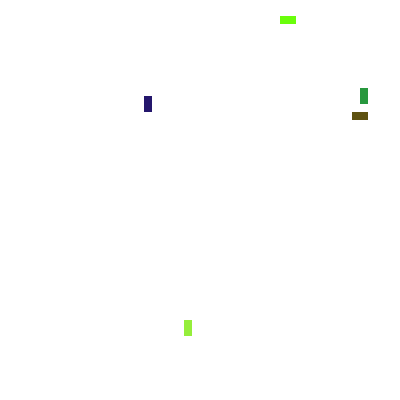

In [4]:
from IPython.display import Image
Image(filename=gif_path)